In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [2]:
from plotly import __version__
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import cufflinks as cf
init_notebook_mode(connected=True)
cf.go_offline()

In [3]:
data = pd.read_csv(r'C:\Users\Sharan\Desktop\All Jupyter Notebooks\income(1).csv')

In [4]:
data.head()

,age,JobType,EdType,maritalstatus,occupation,relationship,race,gender,capitalgain,capitalloss,hoursperweek,nativecountry,SalStat
0,45,Private,HS-grad,Divorced,Adm-clerical,Not-in-family,White,Female,0,0,28,United-States,"less than or equal to 50,000"
1,24,Federal-gov,HS-grad,Never-married,Armed-Forces,Own-child,White,Male,0,0,40,United-States,"less than or equal to 50,000"
2,44,Private,Some-college,Married-civ-spouse,Prof-specialty,Husband,White,Male,0,0,40,United-States,"greater than 50,000"
3,27,Private,9th,Never-married,Craft-repair,Other-relative,White,Male,0,0,40,Mexico,"less than or equal to 50,000"
4,20,Private,Some-college,Never-married,Sales,Not-in-family,White,Male,0,0,35,United-States,"less than or equal to 50,000"


In [5]:
# Figure to beat 1455 wrong classifications

In [7]:
data.describe(include='O')

,JobType,EdType,maritalstatus,occupation,relationship,race,gender,nativecountry,SalStat
count,31978,31978,31978,31978,31978,31978,31978,31978,31978
unique,9,16,7,15,6,5,2,41,2
top,Private,HS-grad,Married-civ-spouse,Prof-specialty,Husband,White,Male,United-States,"less than or equal to 50,000"
freq,22286,10368,14692,4038,12947,27430,21370,29170,24283


In [8]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31978 entries, 0 to 31977
Data columns (total 13 columns):
age              31978 non-null int64
JobType          31978 non-null object
EdType           31978 non-null object
maritalstatus    31978 non-null object
occupation       31978 non-null object
relationship     31978 non-null object
race             31978 non-null object
gender           31978 non-null object
capitalgain      31978 non-null int64
capitalloss      31978 non-null int64
hoursperweek     31978 non-null int64
nativecountry    31978 non-null object
SalStat          31978 non-null object
dtypes: int64(4), object(9)
memory usage: 2.1+ MB


In [9]:
# All Fields have some value filled.

In [10]:
data.describe()

,age,capitalgain,capitalloss,hoursperweek
count,31978.000000,31978.000000,31978.000000,31978.000000
mean,38.579023,1064.360623,86.739352,40.417850
std,13.662085,7298.596271,401.594301,12.345285
min,17.000000,0.000000,0.000000,1.000000
25%,28.000000,0.000000,0.000000,40.000000
50%,37.000000,0.000000,0.000000,40.000000
75%,48.000000,0.000000,0.000000,45.000000
max,90.000000,99999.000000,4356.000000,99.000000


In [11]:
data['capitalgain'].unique()

array([    0,   594, 15024,  7688, 20051,  5013,  2174,  6849,  1055,
        5178,  4101,  1111,  8614,  3411,  2597, 25236,  4386,  4650,
        7298,  2407, 14084,  2463,  3103, 10605,  2964,  3325,  2580,
        3471,  4865, 99999,  6514,  1471,  3674,  2329,  2105,  2885,
       25124,  2176, 10520,  2202,  2961, 27828,  6767,  2228,  1506,
       13550,  1409,  2635,  5556, 14344,  4787,  3781,  3137,  3818,
         914,  4064,   401,  2829,  2977,  4934,  2062,  2354,  3464,
        5455, 15020,  1424,  3273, 22040,  4416,  3908, 10566,   991,
        4931,  1086,  7430, 34095,  6497,   114,  9386,  2346,  3418,
        3432,  2907,  1151,  2414,  2290, 15831, 41310,  4508,  2050,
        2538,  3456,  6418,  1848,  3887,  7896,  5721,  9562,  1455,
        2036,  3942,  1831, 11678,  2936,  2993,  7443,  6360,  1797,
        1173,  4687,  6723,  2009,  6097,  2653,  1639, 18481,  7978,
        2387,  5060], dtype=int64)

In [12]:
data['capitalgain'].value_counts()

0        29320
15024      341
7688       275
7298       242
99999      152
         ...  
5060         1
1639         1
2538         1
7978         1
1111         1
Name: capitalgain, Length: 119, dtype: int64

In [13]:
data['capitalloss'].value_counts()

0       30495
1902      197
1977      163
1887      157
1848       51
        ...  
3004        1
1844        1
2489        1
2201        1
2472        1
Name: capitalloss, Length: 92, dtype: int64

In [16]:
data2 = data.copy(deep=True)
data['SalStat'].unique()

array([' less than or equal to 50,000', ' greater than 50,000'],
      dtype=object)

In [17]:
data.columns

Index(['age', 'JobType', 'EdType', 'maritalstatus', 'occupation',
       'relationship', 'race', 'gender', 'capitalgain', 'capitalloss',
       'hoursperweek', 'nativecountry', 'SalStat'],
      dtype='object')

In [19]:
data['JobType'].unique()

array([' Private', ' Federal-gov', ' ?', ' Self-emp-inc',
       ' Self-emp-not-inc', ' Local-gov', ' State-gov', ' Without-pay',
       ' Never-worked'], dtype=object)

In [25]:
data = pd.read_csv(r'C:\Users\Sharan\Desktop\All Jupyter Notebooks\income(1).csv',index_col=0,na_values=[' ?'])

In [26]:
data['JobType'].unique()

array([' Private', ' Federal-gov', nan, ' Self-emp-inc',
       ' Self-emp-not-inc', ' Local-gov', ' State-gov', ' Without-pay',
       ' Never-worked'], dtype=object)

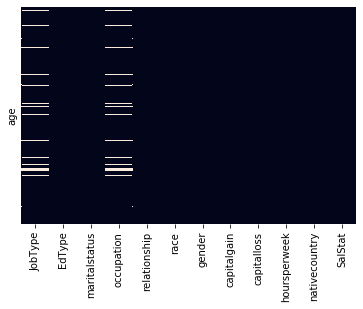

In [27]:
sns.heatmap(data.isnull(),yticklabels=False,cbar=False)

In [35]:
data.isnull().sum()

JobType          1809
EdType              0
maritalstatus       0
occupation       1816
relationship        0
race                0
gender              0
capitalgain         0
capitalloss         0
hoursperweek        0
nativecountry       0
SalStat             0
dtype: int64

In [29]:
data['occupation'].value_counts()

 Prof-specialty       4038
 Craft-repair         4030
 Exec-managerial      3992
 Adm-clerical         3721
 Sales                3584
 Other-service        3212
 Machine-op-inspct    1966
 Transport-moving     1572
 Handlers-cleaners    1350
 Farming-fishing       989
 Tech-support          912
 Protective-serv       644
 Priv-house-serv       143
 Armed-Forces            9
Name: occupation, dtype: int64

In [37]:
data.corr()

,capitalgain,capitalloss,hoursperweek
capitalgain,1.000000,-0.031499,0.079112
capitalloss,-0.031499,1.000000,0.053106
hoursperweek,0.079112,0.053106,1.000000


In [32]:
def output(col):
    if col == ' less than or equal to 50,000':
        return 0
    else:
        return 1

In [38]:
data['Output'] = data['SalStat'].apply(output)

In [39]:
data.head()

,JobType,EdType,maritalstatus,occupation,relationship,race,gender,capitalgain,capitalloss,hoursperweek,nativecountry,SalStat,Output
age,,,,,,,,,,,,,
45,Private,HS-grad,Divorced,Adm-clerical,Not-in-family,White,Female,0,0,28,United-States,"less than or equal to 50,000",0
24,Federal-gov,HS-grad,Never-married,Armed-Forces,Own-child,White,Male,0,0,40,United-States,"less than or equal to 50,000",0
44,Private,Some-college,Married-civ-spouse,Prof-specialty,Husband,White,Male,0,0,40,United-States,"greater than 50,000",1
27,Private,9th,Never-married,Craft-repair,Other-relative,White,Male,0,0,40,Mexico,"less than or equal to 50,000",0
20,Private,Some-college,Never-married,Sales,Not-in-family,White,Male,0,0,35,United-States,"less than or equal to 50,000",0


In [40]:
data.drop('SalStat',axis=1,inplace=True)

In [41]:
data.head()

,JobType,EdType,maritalstatus,occupation,relationship,race,gender,capitalgain,capitalloss,hoursperweek,nativecountry,Output
age,,,,,,,,,,,,
45,Private,HS-grad,Divorced,Adm-clerical,Not-in-family,White,Female,0,0,28,United-States,0
24,Federal-gov,HS-grad,Never-married,Armed-Forces,Own-child,White,Male,0,0,40,United-States,0
44,Private,Some-college,Married-civ-spouse,Prof-specialty,Husband,White,Male,0,0,40,United-States,1
27,Private,9th,Never-married,Craft-repair,Other-relative,White,Male,0,0,40,Mexico,0
20,Private,Some-college,Never-married,Sales,Not-in-family,White,Male,0,0,35,United-States,0


In [42]:
# Missing Values in JobType and Occupation

In [43]:
data.corr()

,capitalgain,capitalloss,hoursperweek,Output
capitalgain,1.000000,-0.031499,0.079112,0.222703
capitalloss,-0.031499,1.000000,0.053106,0.149353
hoursperweek,0.079112,0.053106,1.000000,0.230448
Output,0.222703,0.149353,0.230448,1.000000


In [45]:
data.dtypes

JobType          object
EdType           object
maritalstatus    object
occupation       object
relationship     object
race             object
gender           object
capitalgain       int64
capitalloss       int64
hoursperweek      int64
nativecountry    object
Output            int64
dtype: object

In [46]:
data[data['JobType'].isnull()]

,JobType,EdType,maritalstatus,occupation,relationship,race,gender,capitalgain,capitalloss,hoursperweek,nativecountry,Output
age,,,,,,,,,,,,
17,NaN,11th,Never-married,NaN,Own-child,White,Female,0,0,5,United-States,0
32,NaN,Some-college,Married-civ-spouse,NaN,Husband,White,Male,0,0,40,United-States,0
22,NaN,Some-college,Never-married,NaN,Own-child,White,Male,0,0,40,United-States,0
52,NaN,12th,Never-married,NaN,Other-relative,Black,Male,594,0,40,United-States,0
63,NaN,1st-4th,Married-civ-spouse,NaN,Husband,White,Male,0,0,35,United-States,0
...,...,...,...,...,...,...,...,...,...,...,...,...
59,NaN,Bachelors,Married-civ-spouse,NaN,Husband,White,Male,0,0,40,United-States,1
20,NaN,HS-grad,Never-married,NaN,Other-relative,White,Female,0,0,35,United-States,0
28,NaN,Some-college,Married-civ-spouse,NaN,Wife,White,Female,0,1887,40,United-States,1


In [48]:
data.dropna(axis=0,inplace=True)

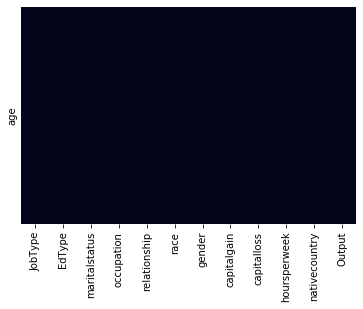

In [49]:
sns.heatmap(data.isnull(),yticklabels=False,cbar=False)

In [50]:
# Now, no missing Values

In [53]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 30162 entries, 45 to 29
Data columns (total 12 columns):
JobType          30162 non-null object
EdType           30162 non-null object
maritalstatus    30162 non-null object
occupation       30162 non-null object
relationship     30162 non-null object
race             30162 non-null object
gender           30162 non-null object
capitalgain      30162 non-null int64
capitalloss      30162 non-null int64
hoursperweek     30162 non-null int64
nativecountry    30162 non-null object
Output           30162 non-null int64
dtypes: int64(4), object(8)
memory usage: 2.1+ MB


In [54]:
data.head()

,JobType,EdType,maritalstatus,occupation,relationship,race,gender,capitalgain,capitalloss,hoursperweek,nativecountry,Output
age,,,,,,,,,,,,
45,Private,HS-grad,Divorced,Adm-clerical,Not-in-family,White,Female,0,0,28,United-States,0
24,Federal-gov,HS-grad,Never-married,Armed-Forces,Own-child,White,Male,0,0,40,United-States,0
44,Private,Some-college,Married-civ-spouse,Prof-specialty,Husband,White,Male,0,0,40,United-States,1
27,Private,9th,Never-married,Craft-repair,Other-relative,White,Male,0,0,40,Mexico,0
20,Private,Some-college,Never-married,Sales,Not-in-family,White,Male,0,0,35,United-States,0


In [65]:
data.reset_index(inplace=True)

In [61]:
data['Output'] = data['Output'].astype('category')


In [66]:
data.dtypes

age                 int64
JobType            object
EdType             object
maritalstatus      object
occupation         object
relationship       object
race               object
gender             object
capitalgain         int64
capitalloss         int64
hoursperweek        int64
nativecountry      object
Output           category
dtype: object

In [68]:
Data = data.copy()

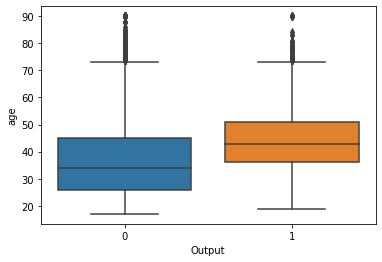

In [69]:
sns.boxplot('Output','age',data=Data)
#Hence, age affects Output

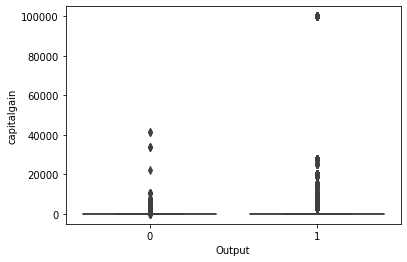

In [73]:
sns.boxplot('Output','capitalgain',data=Data)


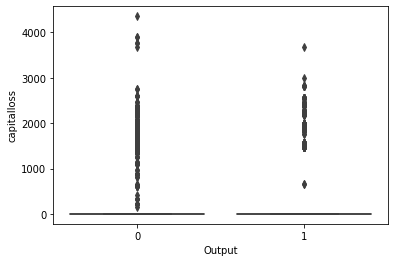

In [74]:
sns.boxplot('Output','capitalloss',data=Data)


In [77]:
Data.iplot(kind='box')

In [78]:
Data.head()

,age,JobType,EdType,maritalstatus,occupation,relationship,race,gender,capitalgain,capitalloss,hoursperweek,nativecountry,Output
0,45,Private,HS-grad,Divorced,Adm-clerical,Not-in-family,White,Female,0,0,28,United-States,0
1,24,Federal-gov,HS-grad,Never-married,Armed-Forces,Own-child,White,Male,0,0,40,United-States,0
2,44,Private,Some-college,Married-civ-spouse,Prof-specialty,Husband,White,Male,0,0,40,United-States,1
3,27,Private,9th,Never-married,Craft-repair,Other-relative,White,Male,0,0,40,Mexico,0
4,20,Private,Some-college,Never-married,Sales,Not-in-family,White,Male,0,0,35,United-States,0


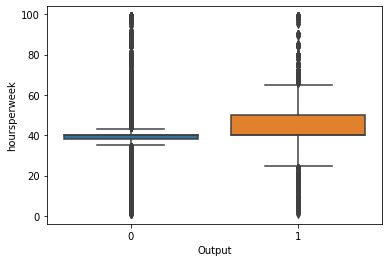

In [83]:
sns.boxplot(x='Output',y='hoursperweek',data=Data)

In [85]:
Data['hoursperweek'].max()

99

In [86]:
Data['relationship'].value_counts()

 Husband           12463
 Not-in-family      7726
 Own-child          4466
 Unmarried          3212
 Wife               1406
 Other-relative      889
Name: relationship, dtype: int64

In [87]:
Data.drop('race',axis=1,inplace=True)

In [88]:
from sklearn.model_selection import train_test_split

In [89]:
Data.dtypes

age                 int64
JobType            object
EdType             object
maritalstatus      object
occupation         object
relationship       object
gender             object
capitalgain         int64
capitalloss         int64
hoursperweek        int64
nativecountry      object
Output           category
dtype: object

In [90]:
jobd = pd.get_dummies(Data['JobType'],drop_first=True)

In [91]:
edd = pd.get_dummies(Data['EdType'],drop_first=True)

In [92]:
mard = pd.get_dummies(Data['maritalstatus'],drop_first=True)
occd = pd.get_dummies(Data['occupation'],drop_first=True)
reld = pd.get_dummies(Data['relationship'],drop_first=True)
gend = pd.get_dummies(Data['gender'],drop_first=True)
natd = pd.get_dummies(Data['nativecountry'],drop_first=True)

In [93]:
Data.drop(['JobType','EdType','maritalstatus','occupation','relationship','gender','nativecountry'],axis=1,inplace=True)

In [95]:
Data = pd.concat([Data,jobd,edd,mard,occd,reld,gend,natd],axis=1)

In [96]:
Data.columns

Index(['age', 'capitalgain', 'capitalloss', 'hoursperweek', 'Output',
       ' Local-gov', ' Private', ' Self-emp-inc', ' Self-emp-not-inc',
       ' State-gov', ' Without-pay', ' 11th', ' 12th', ' 1st-4th', ' 5th-6th',
       ' 7th-8th', ' 9th', ' Assoc-acdm', ' Assoc-voc', ' Bachelors',
       ' Doctorate', ' HS-grad', ' Masters', ' Preschool', ' Prof-school',
       ' Some-college', ' Married-AF-spouse', ' Married-civ-spouse',
       ' Married-spouse-absent', ' Never-married', ' Separated', ' Widowed',
       ' Armed-Forces', ' Craft-repair', ' Exec-managerial',
       ' Farming-fishing', ' Handlers-cleaners', ' Machine-op-inspct',
       ' Other-service', ' Priv-house-serv', ' Prof-specialty',
       ' Protective-serv', ' Sales', ' Tech-support', ' Transport-moving',
       ' Not-in-family', ' Other-relative', ' Own-child', ' Unmarried',
       ' Wife', ' Male', ' Canada', ' China', ' Columbia', ' Cuba',
       ' Dominican-Republic', ' Ecuador', ' El-Salvador', ' England',
       '

In [97]:
X_train, X_test, y_train, y_test = train_test_split(Data.drop('Output',axis=1), 
                                                    Data['Output'], test_size=0.3, 
                                                    random_state=101)

In [98]:
from sklearn.linear_model import LogisticRegression

In [99]:
model = LogisticRegression()
model.fit(X_train,y_train)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)

In [100]:
predictions = model.predict(X_test)

In [104]:
from sklearn.metrics import classification_report,confusion_matrix

In [102]:
print(classification_report(y_test,predictions))

              precision    recall  f1-score   support

           0       0.88      0.93      0.90      6804
           1       0.74      0.60      0.66      2245

    accuracy                           0.85      9049
   macro avg       0.81      0.77      0.78      9049
weighted avg       0.84      0.85      0.84      9049



In [105]:
print(confusion_matrix(y_test,predictions))

[[6341  463]
 [ 897 1348]]


In [106]:
897 + 463

1360